# Regression Problem: Wine dataset

The red and wine datasets were downloaded from [UC Irvine's ML datasets](https://archive.ics.uci.edu/ml/datasets/wine)

## Import packages

In [43]:
# basic
import pandas as pd
import numpy as np
import statistics
import os
import re

# plotting
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [6]:
print(os.getcwd)

<built-in function getcwd>


## Inspect & clean datasets

In [75]:
# Import datasets
red = pd.read_csv('./wine_datasets/winequality-red.csv', sep=';')
wht = pd.read_csv('./wine_datasets/winequality-white.csv', sep=';')
print(f'SHAPES \n red: {red.shape}, white:{wht.shape}')

SHAPES 
 red: (1599, 12), white:(4898, 12)


In [76]:
# Create wine type column and concat into single dataframe
red['type'] = 0
wht['type'] = 1
wine = pd.concat([red, wht], axis=0)
wine.shape

(6497, 13)

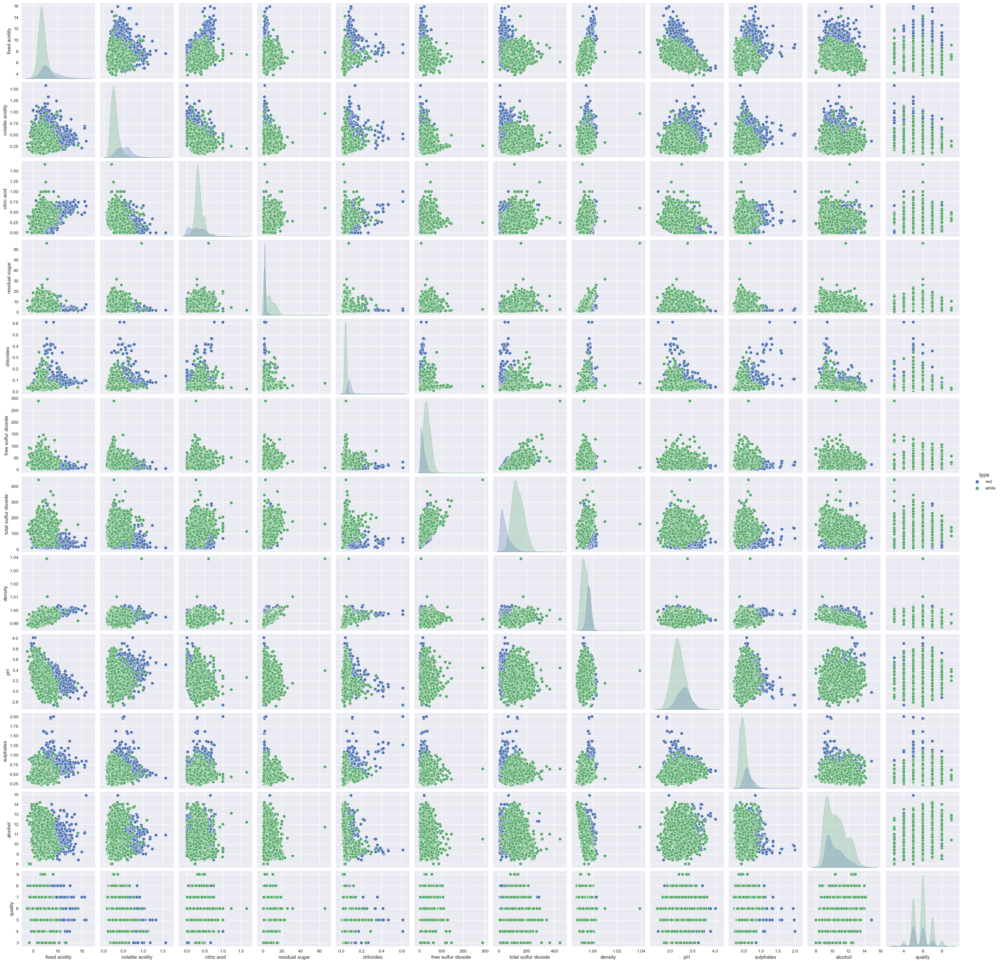

In [49]:
# Create pairplot to compare red and white wines
wine_pairplot = sns.pairplot(wine, hue='type')
fig_wine_pairplot = wine_pairplot.fig
fig_wine_pairplot.savefig("wine_pairplot.png")

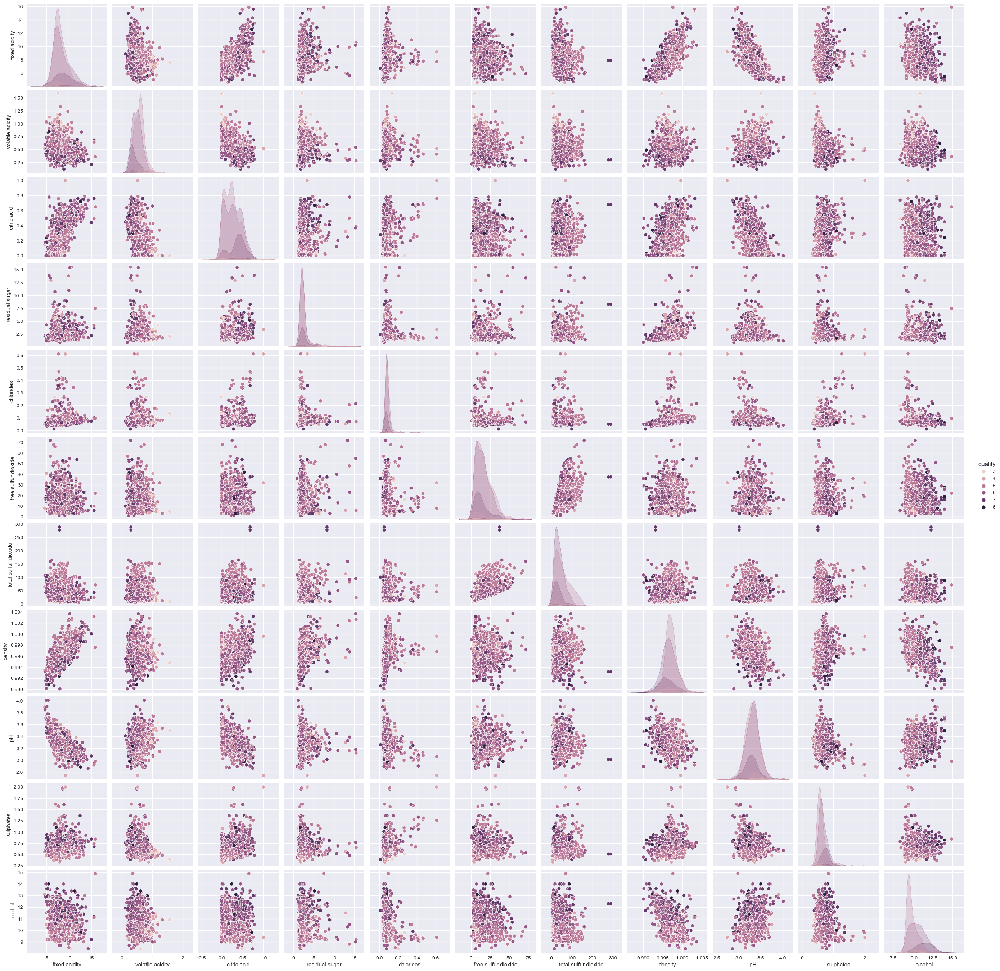

In [50]:
red_pairplot = sns.pairplot(red, hue='quality')
fig_red_pairplot = red_pairplot.fig
fig_red_pairplot.savefig("red_pairplot.png")

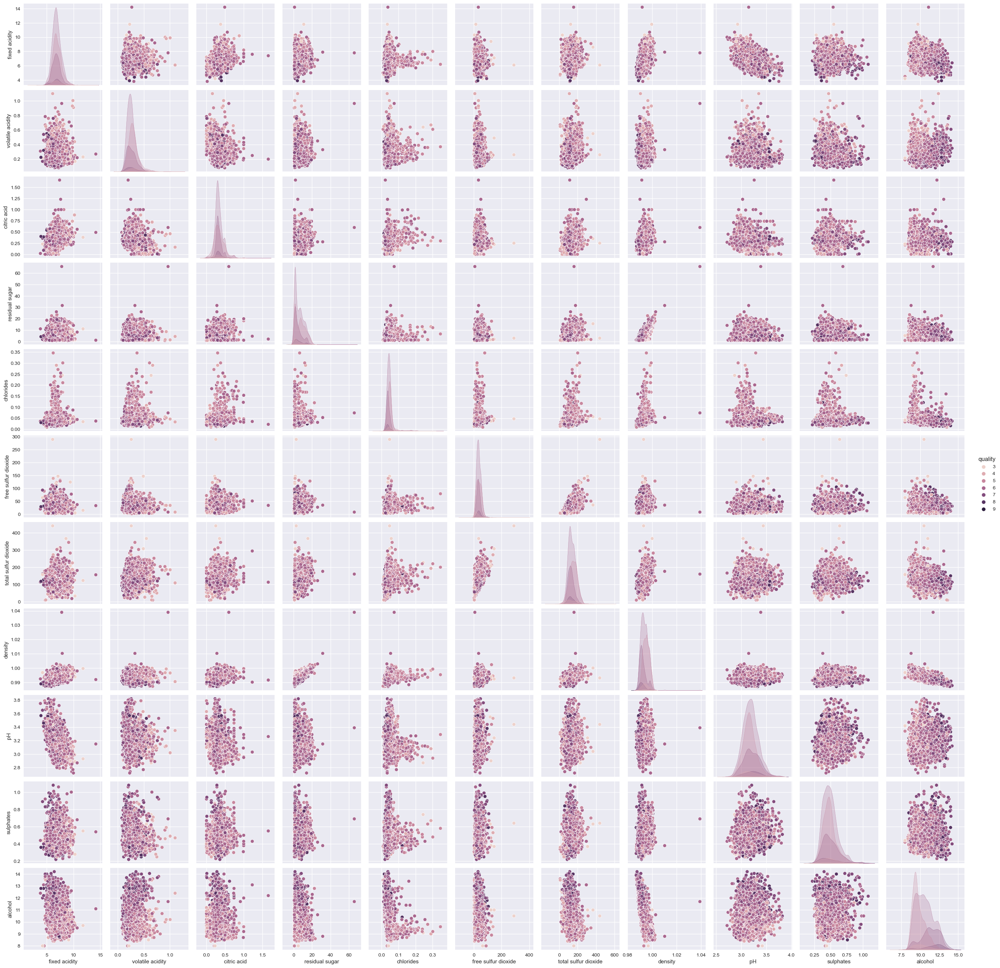

In [51]:
wht_pairplot = sns.pairplot(wht, hue='quality')
fig_wht_pairplot = wht_pairplot.fig
fig_wht_pairplot.savefig("wht_pairplot.png")

<AxesSubplot: >

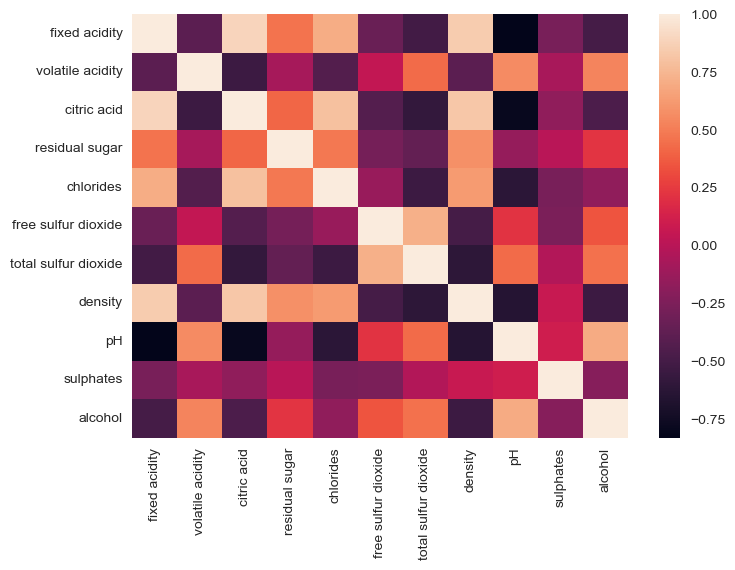

In [92]:
# Check correlations
best_reds = red[red['quality']==8]
best_reds = best_reds[red.columns[:-2]]
sns.heatmap(best_reds.corr())

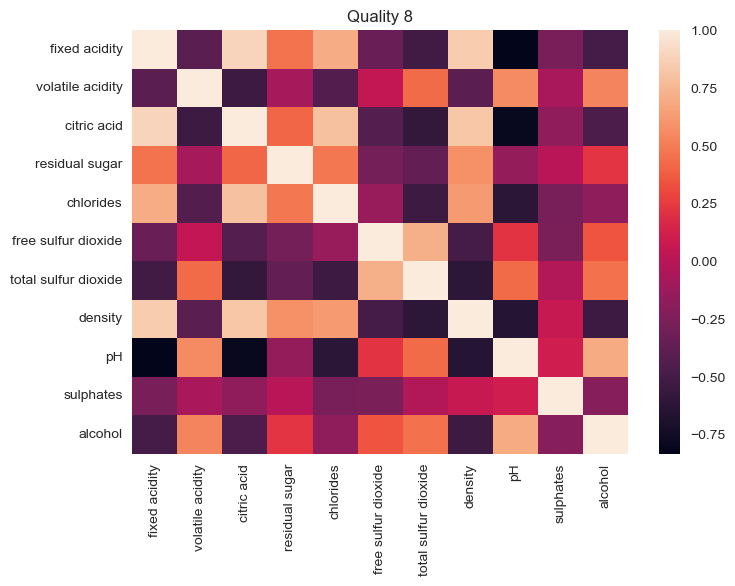

In [102]:
# Check correlations
for i in [8]:# range(3,9):
    best_reds = red[red['quality']==i]
    best_reds = best_reds[best_reds.columns[:-2]]
    sns.heatmap(best_reds.corr())
    plt.title(f'Quality {i}')
    plt.show()

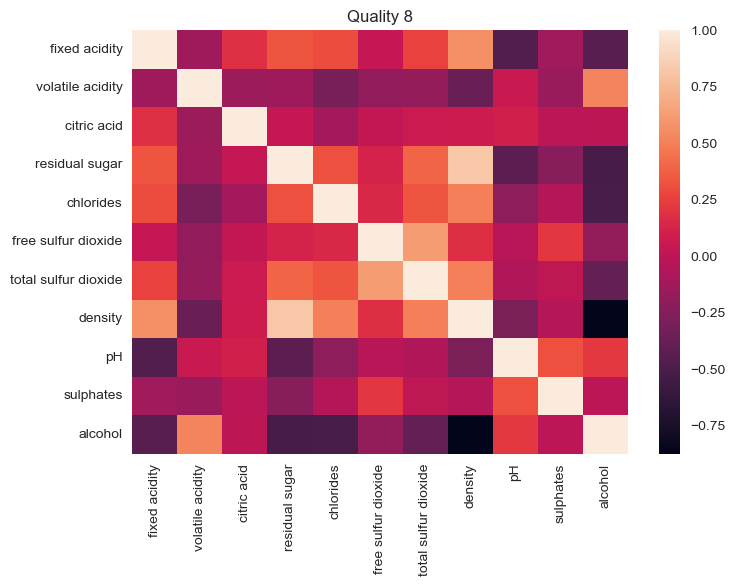

In [109]:
# Check correlations
for i in [8]:# range(3,9):
    best = wht[wht['quality']==i]
    best = best[wht.columns[:-2]]
    sns.heatmap(best.corr())
    plt.title(f'Quality {i}')
    plt.show()

In [171]:
def get_corr(df):
    """Get top correlations between variables in wine dataset"""

    # Create dataframe with correlations from dataset
    df_corr = pd.DataFrame(df[df.columns[:-1]].corr())

    # Round correlations to 2 decimal places
    df_corr = df_corr.round(2)

    # Replace 1 with 0 and sort by max correlation
    df_corr.replace(1, 0, inplace=True)
    df_corr['max'] = df_corr.max(axis=1)
    df_corr.sort_values(by='max', ascending=False,inplace=True)

    # Melt dataframe and remove duplicates
    melt_df_corr = pd.melt(df_corr.reset_index(), id_vars='index')
    melt_df_corr = melt_df_corr[melt_df_corr['variable']!='max']
    # melt_df_corr = melt_df_corr[melt_df_corr['value']>0.1]
    melt_df_corr.sort_values(by='value', ascending=False,inplace=True)

    # Remove duplicates
    melt_df_corr = melt_df_corr[melt_df_corr['index']!=melt_df_corr['variable']]
    melt_df_corr.drop_duplicates(subset=['index','variable'], inplace=True)

    # Create pair column and remove duplicates
    melt_df_corr['pair'] = melt_df_corr['index'] + ' - ' + melt_df_corr['variable']
    melt_df_corr['pair'] = melt_df_corr['pair'].apply(lambda x: sorted(x))
    melt_df_corr.drop_duplicates(subset=['pair'], inplace=True)

    # Remove pair column and sort by value
    melt_df_corr = melt_df_corr[melt_df_corr.columns[:-1]].style.background_gradient(cmap='Blues',subset=['value'])
    return melt_df_corr


In [172]:
get_corr(red)

,index,variable,value
1,citric acid,fixed acidity,0.670000
74,free sulfur dioxide,total sulfur dioxide,0.670000
4,density,fixed acidity,0.670000
126,quality,alcohol,0.480000
56,sulphates,chlorides,0.370000
40,density,residual sugar,0.360000
28,density,citric acid,0.360000
109,citric acid,sulphates,0.310000
114,quality,sulphates,0.250000
133,citric acid,quality,0.230000


In [170]:
red.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type'],
      dtype='object')

In [158]:
get_corr(wht)

,index,variable,value
84,residual sugar,density,0.840000
74,free sulfur dioxide,total sulfur dioxide,0.620000
87,total sulfur dioxide,density,0.530000
125,quality,alcohol,0.440000
39,total sulfur dioxide,residual sugar,0.400000
38,free sulfur dioxide,residual sugar,0.300000
86,free sulfur dioxide,density,0.290000
7,citric acid,fixed acidity,0.290000
90,fixed acidity,density,0.270000
92,chlorides,density,0.260000


In [169]:
red.quality.max()


8.0